In [172]:
#Import libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import seaborn as sns
import datetime


In [173]:
#Load match-by-match soccer SPI ratings and forecast
mat = pd.read_csv('spi_matches.csv')
mat.head()

,season,date,league_id,league,team1,team2,spi1,spi2,prob1,prob2,...,importance1,importance2,score1,score2,xg1,xg2,nsxg1,nsxg2,adj_score1,adj_score2
0,2016,7-24-2016,7921,FA Women's Super League,Reading,Birmingham,50.75,55.03,0.3821,0.3200,...,NaN,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN
1,2016,8-12-2016,1843,French Ligue 1,AS Monaco,Guingamp,68.85,56.48,0.5714,0.1669,...,53.7,22.9,2,2,2.45,0.77,1.75,0.42,2.10,2.10
2,2016,8-13-2016,2411,Barclays Premier League,Hull City,Leicester City,53.57,66.81,0.3459,0.3621,...,38.1,22.2,2,1,0.85,2.77,0.17,1.25,2.10,1.05
3,2016,8-13-2016,2411,Barclays Premier League,Crystal Palace,West Bromwich Albion,55.19,58.66,0.4214,0.2939,...,43.6,34.6,0,1,1.11,0.68,0.84,1.60,0.00,1.05
4,2016,8-13-2016,2411,Barclays Premier League,Everton,Tottenham Hotspur,68.02,73.25,0.3910,0.3401,...,31.9,48.0,1,1,0.73,1.11,0.88,1.81,1.05,1.05


In [174]:
#dimentionality reduction on matches dataset
matches = mat [['season','date','league_id','league','team1','team2','spi1','spi2','prob1','prob2','probtie','proj_score1','proj_score2']]
matches.head()

,season,date,league_id,league,team1,team2,spi1,spi2,prob1,prob2,probtie,proj_score1,proj_score2
0,2016,7-24-2016,7921,FA Women's Super League,Reading,Birmingham,50.75,55.03,0.3821,0.3200,0.2979,1.22,1.09
1,2016,8-12-2016,1843,French Ligue 1,AS Monaco,Guingamp,68.85,56.48,0.5714,0.1669,0.2617,1.82,0.86
2,2016,8-13-2016,2411,Barclays Premier League,Hull City,Leicester City,53.57,66.81,0.3459,0.3621,0.2921,1.16,1.24
3,2016,8-13-2016,2411,Barclays Premier League,Crystal Palace,West Bromwich Albion,55.19,58.66,0.4214,0.2939,0.2847,1.35,1.14
4,2016,8-13-2016,2411,Barclays Premier League,Everton,Tottenham Hotspur,68.02,73.25,0.3910,0.3401,0.2689,1.47,1.38


In [175]:
#Describing the dataset
matches.describe()

,season,league_id,spi1,spi2,prob1,prob2,probtie,proj_score1,proj_score2
count,27263.000000,27263.000000,27263.000000,27263.000000,27263.000000,27263.000000,27263.000000,27263.000000,27263.000000
mean,2018.133771,2109.085904,46.660417,46.575334,0.450509,0.298927,0.250564,1.531171,1.173482
std,1.048650,633.919824,19.376946,19.391183,0.160368,0.145006,0.048309,0.434357,0.427852
min,2016.000000,1818.000000,3.880000,4.040000,0.027100,0.003700,0.000000,0.300000,0.200000
25%,2017.000000,1854.000000,32.530000,32.445000,0.349700,0.204100,0.232100,1.250000,0.900000
50%,2018.000000,1879.000000,44.820000,44.660000,0.441400,0.282700,0.259100,1.460000,1.120000
75%,2019.000000,2160.000000,60.550000,60.530000,0.540600,0.373500,0.280200,1.740000,1.390000
max,2020.000000,7921.000000,96.570000,96.780000,0.977500,0.899200,0.443800,4.900000,4.010000


In [176]:
#load global ranking data
ranking = pd.read_csv('spi_global_rankings.csv')
ranking.head()


,rank,prev_rank,team1,league,off,def,spi
0,1,1,Bayern Munich,German Bundesliga,3.37,0.34,94.33
1,2,2,Manchester City,Barclays Premier League,3.02,0.37,92.02
2,3,3,Liverpool,Barclays Premier League,2.85,0.33,91.44
3,4,4,Barcelona,Spanish Primera Division,2.91,0.39,90.99
4,5,6,Paris Saint-Germain,French Ligue 1,2.99,0.50,89.87


In [177]:
# Delete rows from dataset
ranking1=ranking.drop(columns=['prev_rank', 'league'])
ranking1.head()

,rank,team1,off,def,spi
0,1,Bayern Munich,3.37,0.34,94.33
1,2,Manchester City,3.02,0.37,92.02
2,3,Liverpool,2.85,0.33,91.44
3,4,Barcelona,2.91,0.39,90.99
4,5,Paris Saint-Germain,2.99,0.50,89.87


In [178]:
#fill in mean values where values where null

mat[['xg1','xg2','nsxg1','nsxg2','adj_score1','adj_score2']] = mat[['xg1','xg2','nsxg1','nsxg2','adj_score1','adj_score2']].fillna(value=mat[['xg1','xg2','nsxg1','nsxg2','adj_score1','adj_score2']].mean())
mat.head()


,season,date,league_id,league,team1,team2,spi1,spi2,prob1,prob2,...,importance1,importance2,score1,score2,xg1,xg2,nsxg1,nsxg2,adj_score1,adj_score2
0,2016,7-24-2016,7921,FA Women's Super League,Reading,Birmingham,50.75,55.03,0.3821,0.3200,...,NaN,NaN,1,1,1.510422,1.177696,1.417442,1.144824,1.551257,1.198083
1,2016,8-12-2016,1843,French Ligue 1,AS Monaco,Guingamp,68.85,56.48,0.5714,0.1669,...,53.7,22.9,2,2,2.450000,0.770000,1.750000,0.420000,2.100000,2.100000
2,2016,8-13-2016,2411,Barclays Premier League,Hull City,Leicester City,53.57,66.81,0.3459,0.3621,...,38.1,22.2,2,1,0.850000,2.770000,0.170000,1.250000,2.100000,1.050000
3,2016,8-13-2016,2411,Barclays Premier League,Crystal Palace,West Bromwich Albion,55.19,58.66,0.4214,0.2939,...,43.6,34.6,0,1,1.110000,0.680000,0.840000,1.600000,0.000000,1.050000
4,2016,8-13-2016,2411,Barclays Premier League,Everton,Tottenham Hotspur,68.02,73.25,0.3910,0.3401,...,31.9,48.0,1,1,0.730000,1.110000,0.880000,1.810000,1.050000,1.050000


In [179]:
# Dimentionality reduction 
matches = mat [['season','date','league_id','league','team1','prob1','prob2','probtie','proj_score1','proj_score2','xg1','xg2','nsxg1','nsxg2','adj_score1','adj_score2']]
matches.head()

,season,date,league_id,league,team1,prob1,prob2,probtie,proj_score1,proj_score2,xg1,xg2,nsxg1,nsxg2,adj_score1,adj_score2
0,2016,7-24-2016,7921,FA Women's Super League,Reading,0.3821,0.3200,0.2979,1.22,1.09,1.510422,1.177696,1.417442,1.144824,1.551257,1.198083
1,2016,8-12-2016,1843,French Ligue 1,AS Monaco,0.5714,0.1669,0.2617,1.82,0.86,2.450000,0.770000,1.750000,0.420000,2.100000,2.100000
2,2016,8-13-2016,2411,Barclays Premier League,Hull City,0.3459,0.3621,0.2921,1.16,1.24,0.850000,2.770000,0.170000,1.250000,2.100000,1.050000
3,2016,8-13-2016,2411,Barclays Premier League,Crystal Palace,0.4214,0.2939,0.2847,1.35,1.14,1.110000,0.680000,0.840000,1.600000,0.000000,1.050000
4,2016,8-13-2016,2411,Barclays Premier League,Everton,0.3910,0.3401,0.2689,1.47,1.38,0.730000,1.110000,0.880000,1.810000,1.050000,1.050000


In [180]:
#merge datasets matches and ranking

matches_data = mat.merge(ranking1,on= 'team1')
matches_data.head()

,season,date,league_id,league,team1,team2,spi1,spi2,prob1,prob2,...,xg1,xg2,nsxg1,nsxg2,adj_score1,adj_score2,rank,off,def,spi
0,2016,7-24-2016,7921,FA Women's Super League,Reading,Birmingham,50.75,55.03,0.3821,0.3200,...,1.510422,1.177696,1.417442,1.144824,1.551257,1.198083,210,1.26,1.2,46.93
1,2017,8-12-2017,2412,English League Championship,Reading,Fulham,33.48,42.69,0.3351,0.4072,...,1.410000,0.280000,2.340000,0.480000,1.050000,1.050000,210,1.26,1.2,46.93
2,2017,8-15-2017,2412,English League Championship,Reading,Aston Villa,34.35,40.69,0.3630,0.3519,...,1.080000,0.710000,1.260000,1.050000,2.100000,1.050000,210,1.26,1.2,46.93
3,2017,9-9-2017,2412,English League Championship,Reading,Bristol City,35.55,35.78,0.4250,0.2989,...,1.130000,0.730000,1.730000,0.670000,0.000000,1.050000,210,1.26,1.2,46.93
4,2017,9-23-2017,2412,English League Championship,Reading,Hull City,35.30,44.88,0.3288,0.4051,...,0.800000,0.610000,1.010000,0.450000,1.050000,1.050000,210,1.26,1.2,46.93


In [282]:
#exploratory data analysis

#test to_datetime method
pd.to_datetime(mat.loc[:, 'date'], format = "%m-%d-%Y")
#convert datatype
mat.loc[:, 'date'] = pd.to_datetime(mat.loc[:, 'date'], format = "%m-%d-%Y")

In [278]:
#group by league
grouped_league = mat.groupby(['season','league'])


In [281]:
#minimum and maximum dates
min_dates = grouped_league['date'].min()
max_dates = grouped_league['date'].max()


In [280]:
#create dataframe
exp_mat = pd.DataFrame({'Start Date': min_dates, 'End Date': max_dates})
exp_mat.head(10)

Start Date   End Date
season league                                                        
2016   Barclays Premier League                  2016-08-13 2017-05-21
       FA Women's Super League                  2016-07-24 2016-07-24
       French Ligue 1                           2016-08-12 2017-05-20
       German Bundesliga                        2016-08-26 2017-05-20
       Italy Serie A                            2016-08-20 2017-05-28
       Mexican Primera Division Torneo Clausura 2017-01-07 2017-05-28
       Spanish Primera Division                 2016-08-19 2017-05-21
       UEFA Champions League                    2016-09-13 2017-06-03
2017   Argentina Primera Division               2017-08-26 2018-05-14
       Austrian T-Mobile Bundesliga             2017-07-22 2018-05-27

In [283]:
#count the number of days in each league
No_of_days= exp_mat['End Date']-exp_mat['Start Date']
No_of_days
exp_mat['League Duration']=No_of_days
exp_mat.sort_values(by=['League Duration'], ascending=False).head(10)


Start Date   End Date League Duration
season league                                                             
2019   Swiss Raiffeisen Super League 2019-07-19 2020-08-03        381 days
       Danish SAS-Ligaen             2019-07-14 2020-07-29        381 days
       Russian Premier Liga          2019-07-12 2020-07-22        376 days
       Spanish Segunda Division      2019-08-17 2020-08-23        372 days
       English League Championship   2019-08-02 2020-08-04        368 days
       Italy Serie B                 2019-08-23 2020-08-20        363 days
       Austrian T-Mobile Bundesliga  2019-07-26 2020-07-15        355 days
       Portuguese Liga               2019-08-09 2020-07-26        352 days
       Barclays Premier League       2019-08-09 2020-07-26        352 days
       English League One            2019-08-03 2020-07-13        345 days

In [284]:
# Number of matches played in each league
match_count=mat.groupby(['season', 'league'])['team1'].count()
exp_mat['Number of matches']=match_count
exp_mat.sort_values(by=['Number of matches'], ascending=False).head(10)

Start Date   End Date League Duration  \
season league                                                              
2019   United Soccer League        2019-03-08 2019-11-17        254 days   
2018   English League Championship 2018-08-03 2019-05-27        297 days   
       English League One          2018-08-04 2019-05-26        295 days   
2019   English League Championship 2019-08-02 2020-08-04        368 days   
2017   English League Championship 2017-08-04 2018-05-26        295 days   
2018   United Soccer League        2018-03-16 2018-11-08        237 days   
2019   Major League Soccer         2019-03-02 2019-11-10        253 days   
2018   Major League Soccer         2018-03-03 2018-12-08        280 days   
2019   English League Two          2019-08-03 2020-06-29        331 days   
       English League One          2019-08-03 2020-07-13        345 days   

                                    Number of matches  
season league                                          
2019   United Soccer League                       561  
2018   English League Championship                557  
       English League One                         557  
2019   English League Championship                557  
2017   English League Championship                557  
2018   United Soccer League                       422  
2019   Major League Soccer                        421  
2018   Major League Soccer                        408  
2019   English League Two                         408  
       English League One                         405

In [197]:
#off, def and spi as fixed attributes
x=matches_data['spi']
x=x.to_numpy()
y=matches_data['rank']
y=y.to_numpy()
print(x)
print(y)

[46.93 46.93 46.93 ... 20.57 25.25 20.89]
[210 210 210 ... 542 494 540]


In [198]:
linreg = LinearRegression()

In [199]:
x= x.reshape(-1, 1)
y=y.reshape(-1,1)
y

array([[210],
       [210],
       [210],
       ...,
       [542],
       [494],
       [540]], dtype=int64)

In [200]:
linreg.fit(x, y)

LinearRegression()

In [201]:
y_pred = linreg.predict(x)

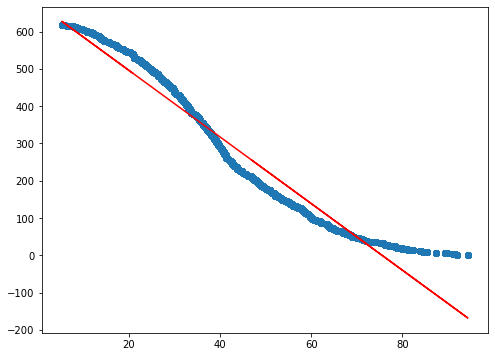

In [219]:
fig = plt.figure(figsize=(8, 6))
plt.scatter(x,y)
plt.plot(x,y_pred, color='red')
plt.show()

In [224]:
#off, def and spi as fixed attributes multiple regression
reg = LinearRegression()
reg.fit (matches_data[['xg1','nsxg1','adj_score1']],matches_data.score1)

LinearRegression()

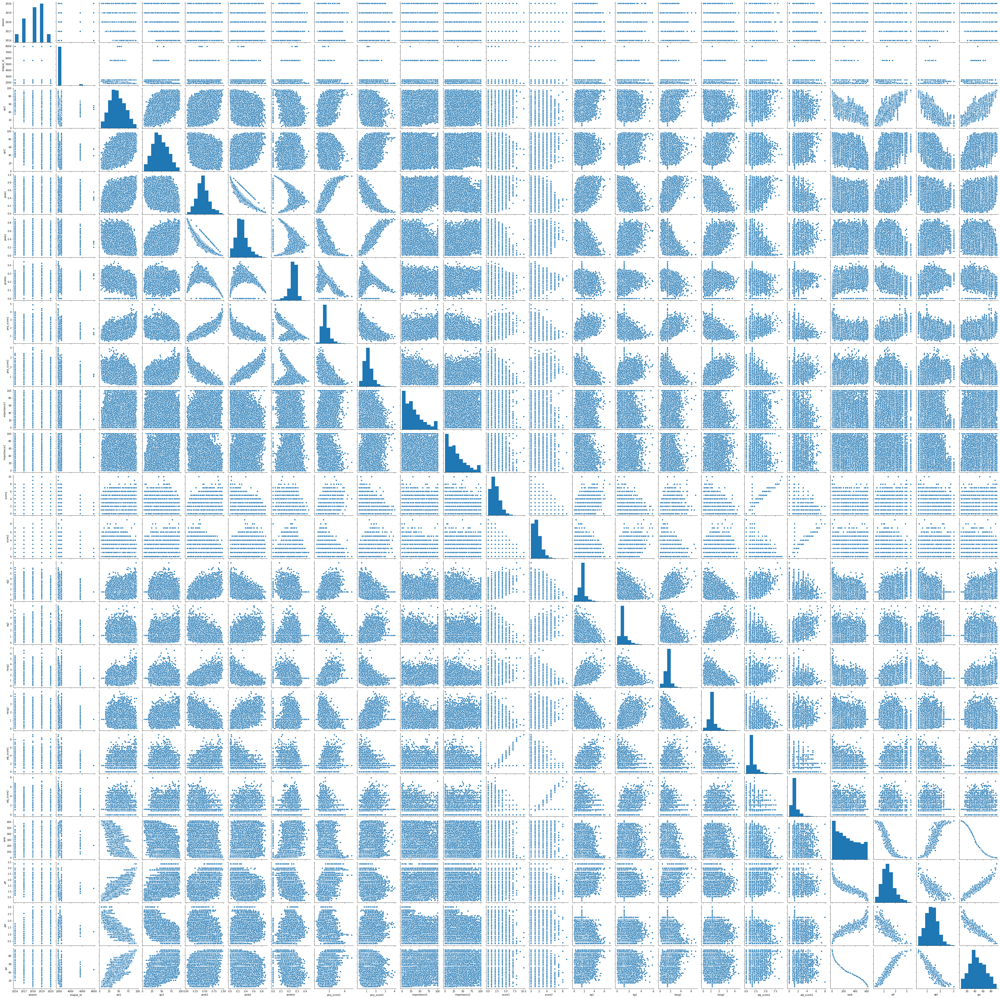

In [23]:
sns.pairplot(matches_data)

In [225]:
#Gradient booster regression
from sklearn.model_selection import train_test_split
from sklearn import ensemble

x_training_set, x_test_set, y_training_set, y_test_set = train_test_split(x,y,test_size=0.10, 
                                                                          random_state=42,
                                                                          shuffle=True)

In [226]:
#fit regression model
params = {'n_estimators': 500, 'max_depth': 4, 'min_samples_split': 2,
          'learning_rate': 0.01, 'loss': 'ls'}
model = ensemble.GradientBoostingRegressor(**params)

model.fit(x_training_set, y_training_set)

C:\Users\shrik\anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


GradientBoostingRegressor(learning_rate=0.01, max_depth=4, n_estimators=500)

In [227]:
y_predicted = model.predict(x_test_set)

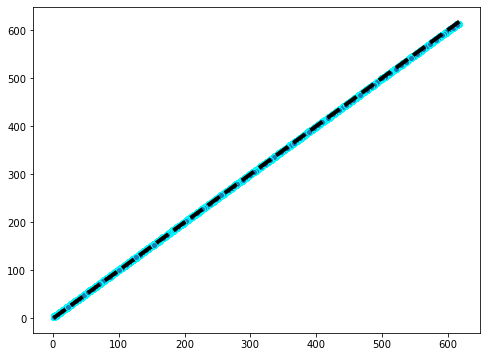

In [228]:
fig = plt.figure(figsize=(8, 6))
plt.scatter(y_test_set, y_predicted, edgecolors=(0, 1, 1))
plt.plot([y_test_set.min(), y_test_set.max()], [y_test_set.min(), y_test_set.max()], 'k--', lw=4)
plt.show()

In [266]:
# multiple linear gregression
X = matches_data[['xg1','nsxg1','adj_score1']] # 3 variables as input to prdit scores
Y = matches_data[['score1']]
regr = LinearRegression()
regr.fit(X, Y)

LinearRegression()

In [267]:
print('Intercept: \n', regr.intercept_)
print('Coefficients: \n', regr.coef_)

Intercept: 
 [-0.07772439]
Coefficients: 
 [[0.03972229 0.00118525 1.00006083]]


In [272]:
import statsmodels.api as sm
X = sm.add_constant(X)
model = sm.OLS(Y, X).fit()
model.params
regr.predict([[4.81,2.89,6.07]]) #Test the predicted score

array([[6.18713444]])

In [273]:
predictions = model.predict(X) 

In [274]:
print_model = model.summary()
print(print_model)

                            OLS Regression Results                            
Dep. Variable:                 score1   R-squared:                       0.568
Model:                            OLS   Adj. R-squared:                  0.567
Method:                 Least Squares   F-statistic:                 1.192e+04
Date:                Mon, 05 Oct 2020   Prob (F-statistic):               0.00
Time:                        20:57:03   Log-Likelihood:                -34009.
No. Observations:               27263   AIC:                         6.803e+04
Df Residuals:                   27259   BIC:                         6.806e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0777      0.016     -4.731      0.0